In [1]:
%pylab inline
import time
import os 
image_dir = os.getcwd() + '/Images/'
model_dir = os.getcwd() + '/Models/'

import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
from torch import optim

import torchvision
from torchvision import transforms

from PIL import Image
from collections import OrderedDict

import numpy as np
import matplotlib.pyplot as plt

Populating the interactive namespace from numpy and matplotlib


In [2]:
#vgg definition that conveniently let's you grab the outputs from any layer
class VGG(nn.Module):
    def __init__(self, pool='max'):
        super(VGG, self).__init__()
        #vgg modules
        self.conv1_1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_3 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_4 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_4 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_4 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        if pool == 'max':
            self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool5 = nn.MaxPool2d(kernel_size=2, stride=2)
        elif pool == 'avg':
            self.pool1 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool2 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool3 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool4 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool5 = nn.AvgPool2d(kernel_size=2, stride=2)
            
    def forward(self, x, out_keys):
        out = {}
        out['r11'] = F.relu(self.conv1_1(x))
        out['r12'] = F.relu(self.conv1_2(out['r11']))
        out['p1'] = self.pool1(out['r12'])
        out['r21'] = F.relu(self.conv2_1(out['p1']))
        out['r22'] = F.relu(self.conv2_2(out['r21']))
        out['p2'] = self.pool2(out['r22'])
        out['r31'] = F.relu(self.conv3_1(out['p2']))
        out['r32'] = F.relu(self.conv3_2(out['r31']))
        out['r33'] = F.relu(self.conv3_3(out['r32']))
        out['r34'] = F.relu(self.conv3_4(out['r33']))
        out['p3'] = self.pool3(out['r34'])
        out['r41'] = F.relu(self.conv4_1(out['p3']))
        out['r42'] = F.relu(self.conv4_2(out['r41']))
        out['r43'] = F.relu(self.conv4_3(out['r42']))
        out['r44'] = F.relu(self.conv4_4(out['r43']))
        out['p4'] = self.pool4(out['r44'])
        out['r51'] = F.relu(self.conv5_1(out['p4']))
        out['r52'] = F.relu(self.conv5_2(out['r51']))
        out['r53'] = F.relu(self.conv5_3(out['r52']))
        out['r54'] = F.relu(self.conv5_4(out['r53']))
        out['p5'] = self.pool5(out['r54'])
        return [out[key] for key in out_keys]

In [3]:
# gram matrix and loss
class GramMatrix(nn.Module):
    def forward(self, input):
        b,c,h,w = input.size()
        F = input.view(b, c, h*w)
        G = torch.bmm(F, F.transpose(1,2)) 
        G.div_(h*w)
        return G

class GramMSELoss(nn.Module):
    def forward(self, input, target):
        out = nn.MSELoss()(GramMatrix()(input), target)
        return(out)

In [4]:
# pre and post processing for images
img_size = 270 # to change
prep = transforms.Compose([transforms.Resize(img_size),
                           transforms.ToTensor(),
                           transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])]), #turn to BGR
                           transforms.Normalize(mean=[0.40760392, 0.45795686, 0.48501961], #subtract imagenet mean
                                                std=[1,1,1]),
                           transforms.Lambda(lambda x: x.mul_(255)),
                          ])
postpa = transforms.Compose([transforms.Lambda(lambda x: x.mul_(1./255)),
                           transforms.Normalize(mean=[-0.40760392, -0.45795686, -0.48501961], #add imagenet mean
                                                std=[1,1,1]),
                           transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])]), #turn to RGB
                           ])
postpb = transforms.Compose([transforms.ToPILImage()])
def postp(tensor): # to clip results in the range [0,1]
    t = postpa(tensor)
    t[t>1] = 1    
    t[t<0] = 0
    img = postpb(t)
    return img

In [5]:
#get network
vgg = VGG()
vgg.load_state_dict(torch.load(model_dir + 'vgg_conv.pth'))
for param in vgg.parameters():
    param.requires_grad = False
if torch.cuda.is_available():
    vgg.cuda()

In [6]:
name_left = '134l.png'
name_right = '134r.png'

In [7]:
#load images, ordered as [style_image, content_image]
img_dirs = [image_dir, image_dir, image_dir]
img_names = ['abst.jpg', name_right, name_left] 
imgs = [Image.open(img_dirs[i] + name) for i,name in enumerate(img_names)]
imgs_torch = [prep(img) for img in imgs]
if torch.cuda.is_available():
    imgs_torch = [Variable(img.unsqueeze(0).cuda()) for img in imgs_torch]
else:
    imgs_torch = [Variable(img.unsqueeze(0)) for img in imgs_torch]
style_image, content_image_r, content_image_l = imgs_torch

In [8]:
imgs[1].size

(960, 540)

In [9]:
# opt_img = Variable(torch.randn(content_image.size()).type_as(content_image.data), requires_grad=True) #random init
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)

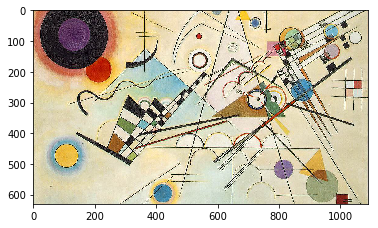

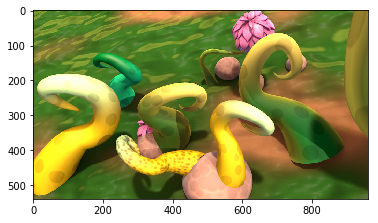

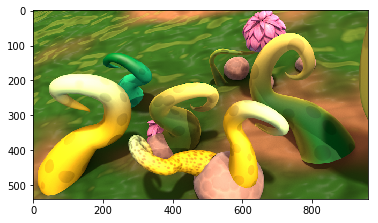

In [10]:
#display images
for img in imgs:
    imshow(img);show()

In [11]:
#define layers, loss functions, weights and compute optimization targets
style_layers = ['r11','r21','r31','r41', 'r51'] 
content_layers = ['r42']
loss_layers = style_layers + content_layers
loss_fns = [GramMSELoss()] * len(style_layers) + [nn.MSELoss()] * len(content_layers)
if torch.cuda.is_available():
    loss_fns = [loss_fn.cuda() for loss_fn in loss_fns]
    
#these are good weights settings:
style_weights = [1e3/n**2 for n in [64,128,256,512,512]]
content_weights = [1e0]
weights = style_weights + content_weights

#compute optimization targets
style_targets = [GramMatrix()(A).detach() for A in vgg(style_image, style_layers)]
content_targets_r = [A.detach() for A in vgg(content_image_r, content_layers)]
content_targets_l = [A.detach() for A in vgg(content_image_l, content_layers)]
targets_r = style_targets + content_targets_r
targets_l = style_targets + content_targets_l

In [12]:
import DispNet

model_disp = torch.load('Models/disp_net-5.pth')

In [13]:
for param in model_disp.parameters():
    param.requires_grad = False

In [14]:
new_shape = (1,2,270,480)

In [17]:
output = model_disp(torch.cat((opt_img_l, opt_img_r), 1))
disp_true = Variable(output.data, requires_grad=False).cuda()

# One disparity each of 3 channels of color 

In [44]:
opt_img_l_0 = torch.cat((opt_img_l[:,:1,:,:], torch.zeros(new_shape).cuda()),1) 
opt_img_r_0 = torch.cat((opt_img_r[:,:1,:,:], torch.zeros(new_shape).cuda()),1) 
opt_img_l_1 = torch.cat((opt_img_l[:,1:2,:,:], torch.zeros(new_shape).cuda()),1) 
opt_img_r_1 = torch.cat((opt_img_r[:,1:2,:,:], torch.zeros(new_shape).cuda()),1) 
opt_img_l_2 = torch.cat((opt_img_l[:,2:3,:,:], torch.zeros(new_shape).cuda()),1) 
opt_img_r_2 = torch.cat((opt_img_r[:,2:3,:,:], torch.zeros(new_shape).cuda()),1) 

In [45]:
output_0 = model_disp(torch.cat((opt_img_l_0, opt_img_r_0), 1))
output_1 = model_disp(torch.cat((opt_img_l_1, opt_img_r_1), 1))
output_2 = model_disp(torch.cat((opt_img_l_2, opt_img_r_2), 1)) 

In [46]:
disp_true_0 = Variable(output_0.data, requires_grad=False).cuda()
disp_true_1 = Variable(output_1.data, requires_grad=False).cuda()
disp_true_2 = Variable(output_2.data, requires_grad=False).cuda()

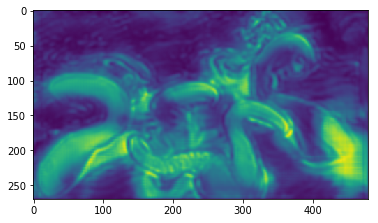

In [47]:
#out_img = postp(output.data[0].cpu().squeeze())
imshow(output_1.cpu().data.numpy().squeeze())

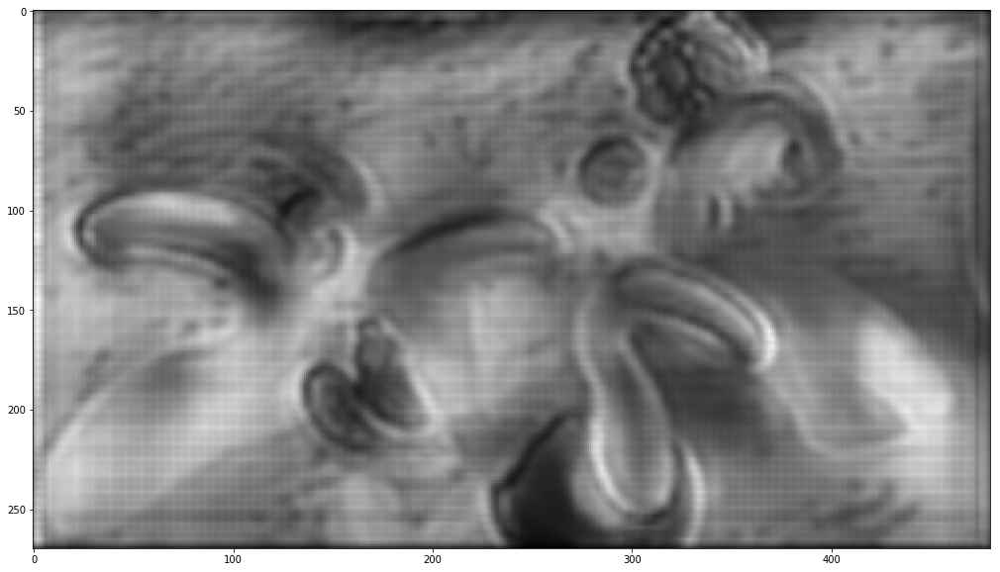

In [48]:
plt.figure(figsize=(20,10))
plt.imshow(disp_true_0.data.cpu().numpy().squeeze(), cmap='gray')
plt.imsave('disp_dispnet.jpg', disp_true_0.data.cpu().numpy().squeeze(), cmap='gray')

In [49]:
from tqdm import tqdm

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:42: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 21889120.000000
Loss on disp 1: 1962733600.0
Loss on disp 2: 1319749500.0
Loss on disp 3: 1047543040.0
Time: 0.53
Iteration: 100, loss: 12401347.000000
Loss on disp 1: 1276551600.0
Loss on disp 2: 861062200.0
Loss on disp 3: 626648060.0
Time: 0.53
Iteration: 150, loss: 9078884.000000
Loss on disp 1: 893983040.0
Loss on disp 2: 618229760.0
Loss on disp 3: 480821980.0
Time: 0.53
Iteration: 200, loss: 7305696.000000
Loss on disp 1: 659573900.0
Loss on disp 2: 493910270.0
Loss on disp 3: 401367520.0
Time: 0.53
Iteration: 250, loss: 6213394.000000
Loss on disp 1: 530636030.0
Loss on disp 2: 415414300.0
Loss on disp 3: 340714000.0
Time: 0.54
Iteration: 300, loss: 5461264.500000
Loss on disp 1: 450363300.0
Loss on disp 2: 364931700.0
Loss on disp 3: 297054340.0
Time: 0.54
Iteration: 350, loss: 4946676.000000
Loss on disp 1: 387669540.0
Loss on disp 2: 321945120.0
Loss on disp 3: 260363180.0
Time: 0.54
Iteration: 400, loss: 4572870.500000
Loss on disp 1: 342392320.0
Loss o

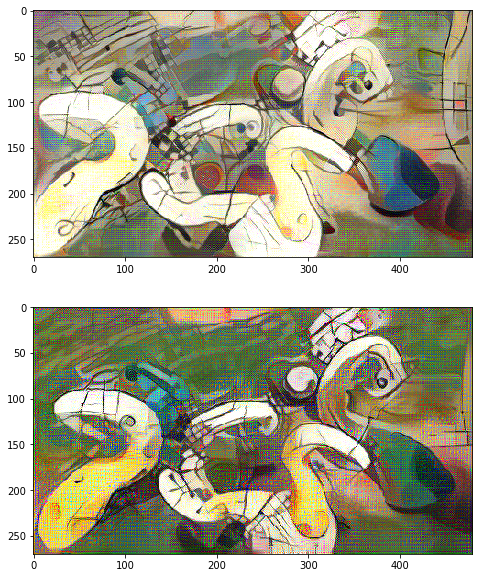

In [50]:
#run style transfer
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 500 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        #new_image = F.grid_sample(opt_img_l, grid_scaled) # for cv2 - right
        
        loss = 0
        loss += sum(layer_losses)
        loss += sum(layer_losses_l)
        opt_img_l_0 = torch.cat((opt_img_l[:,:1,:,:], torch.zeros(new_shape).cuda()),1)
        opt_img_r_0 = torch.cat((opt_img_r[:,:1,:,:], torch.zeros(new_shape).cuda()),1)
        opt_img_l_1 = torch.cat((opt_img_l[:,1:2,:,:], torch.zeros(new_shape).cuda()),1)
        opt_img_r_1 = torch.cat((opt_img_r[:,1:2,:,:], torch.zeros(new_shape).cuda()),1)
        opt_img_l_2 = torch.cat((opt_img_l[:,2:3,:,:], torch.zeros(new_shape).cuda()),1)
        opt_img_r_2 = torch.cat((opt_img_r[:,2:3,:,:], torch.zeros(new_shape).cuda()),1)
        #loss_disp = (((new_image[:,:,:,17:] > 0).float()*(opt_img_l[:,:,:,17:]-new_image[:,:,:,17:]))**2).sum()
        #loss_disp = (((opt_img_l[:,:,13:-13,60:-13]-new_image[:,:,13:-13,60:-13]))**2).sum() # to do: add disparity loss 
        #loss_disp = (((opt_img_r-new_image))**2).sum() # for cv2 - left
        loss_disp_1 = ((model_disp(torch.cat((opt_img_l_0, opt_img_r_0),1))-disp_true_0)**2).sum()
        loss_disp_2 = ((model_disp(torch.cat((opt_img_l_1, opt_img_r_1),1))-disp_true_1)**2).sum()
        loss_disp_3 = ((model_disp(torch.cat((opt_img_l_2, opt_img_r_2),1))-disp_true_2)**2).sum()
        loss += 0.0005*(loss_disp_1+loss_disp_2+loss_disp_3)  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            print('Loss on disp 1:', loss_disp_1.data.cpu().numpy())
            print('Loss on disp 2:', loss_disp_2.data.cpu().numpy())
            print('Loss on disp 3:', loss_disp_3.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

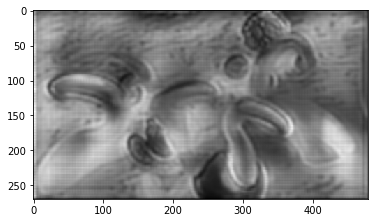

In [34]:
output_0 = model_disp(torch.cat((opt_img_l_0, opt_img_r_0), 1))
plt.imshow(output_0.data.cpu().numpy().squeeze(),cmap='gray')
plt.imsave('disp_dispnet_final.jpg', output_0.data.cpu().numpy().squeeze(),cmap='gray')

In [51]:
img_styled = postp(opt_img_r.data[0].cpu().squeeze())
img_styled.save('Images/abst_dispnet_134_r.png')
img_styled = postp(opt_img_l.data[0].cpu().squeeze())
img_styled.save('Images/abst_dispnet_134_l.png')

# Stylizing first, then add disparity

In [16]:
output = model_disp(torch.cat((opt_img_l, opt_img_r), 1))
disp_true = Variable(output.data, requires_grad=False).cuda()

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:35: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 15244964.000000
Time: 0.33
Iteration: 100, loss: 6700360.000000
Time: 0.33
Iteration: 150, loss: 4015396.000000
Time: 0.33
Iteration: 200, loss: 3058583.000000
Time: 0.33
Iteration: 250, loss: 2530894.250000
Time: 0.33
Iteration: 300, loss: 2176256.250000
Time: 0.33
Iteration: 350, loss: 1937396.500000
Time: 0.33
Iteration: 400, loss: 1776154.000000
Time: 0.33


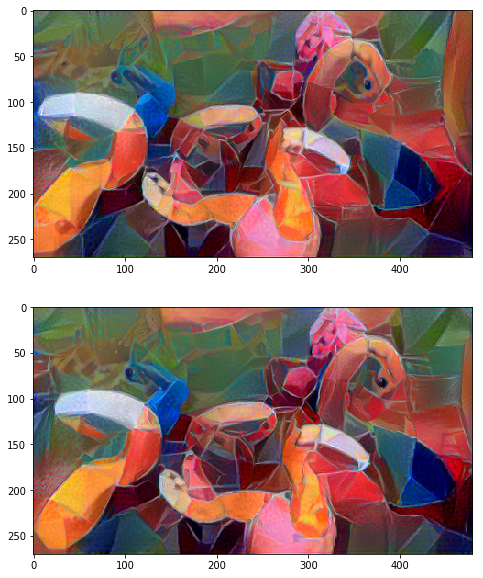

In [44]:
#run style transfer
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 400 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        #new_image = F.grid_sample(opt_img_l, grid_scaled) # for cv2 - right
        
        loss = 0
        loss += sum(layer_losses)
        loss += sum(layer_losses_l)
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            #print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:33: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 686712640.000000
Loss on disp: 1295473900.0
Time: 0.40
Iteration: 100, loss: 167723040.000000
Loss on disp: 291285200.0
Time: 0.40
Iteration: 150, loss: 75019784.000000
Loss on disp: 121567470.0
Time: 0.40
Iteration: 200, loss: 41637248.000000
Loss on disp: 62400730.0
Time: 0.40


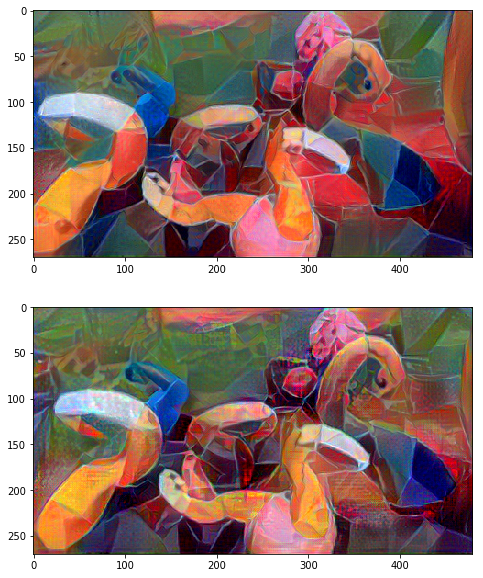

In [45]:
#run style transfer
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 200 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        #new_image = F.grid_sample(opt_img_l, grid_scaled) # for cv2 - right
        
        loss = 0
        loss += sum(layer_losses)
        loss += sum(layer_losses_l)
        #loss_disp = (((new_image[:,:,:,17:] > 0).float()*(opt_img_l[:,:,:,17:]-new_image[:,:,:,17:]))**2).sum()
        #loss_disp = (((opt_img_l[:,:,13:-13,60:-13]-new_image[:,:,13:-13,60:-13]))**2).sum() # to do: add disparity loss 
        #loss_disp = (((opt_img_r-new_image))**2).sum() # for cv2 - left

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.5*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

# First right, then left is styled towards right with disparity

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:38: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 6834786.000000
Time: 0.17
Iteration: 100, loss: 3155089.500000
Time: 0.17
Iteration: 150, loss: 1935084.875000
Time: 0.17
Iteration: 200, loss: 1454961.500000
Time: 0.17
Iteration: 250, loss: 1189032.000000
Time: 0.17
Iteration: 300, loss: 1021073.187500
Time: 0.17
Iteration: 350, loss: 914433.875000
Time: 0.17
Iteration: 400, loss: 841425.500000
Time: 0.16


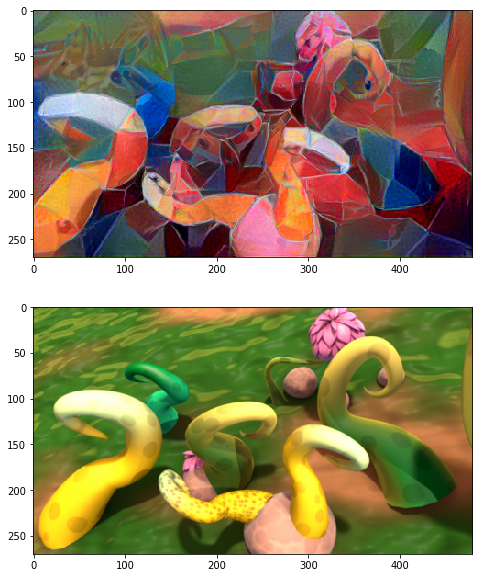

In [46]:
#run style transfer
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r], max_iter = 5)

max_iter = 400 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        #out_l = vgg(opt_img_l, loss_layers)
        #layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        #new_image = F.grid_sample(opt_img_l, grid_scaled) # for cv2 - right
        
        loss = 0
        loss += sum(layer_losses)
        #loss += sum(layer_losses)
        #loss_disp = (((new_image[:,:,:,17:] > 0).float()*(opt_img_l[:,:,:,17:]-new_image[:,:,:,17:]))**2).sum()
        #loss_disp = (((opt_img_l[:,:,13:-13,60:-13]-new_image[:,:,13:-13,60:-13]))**2).sum() # to do: add disparity loss 
        #loss_disp = (((opt_img_r-new_image))**2).sum() # for cv2 - left
        
        '''
        if n_iter[0]-1 > 400:
            loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
            loss += loss_disp  
        '''
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            #    print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

In [47]:
opt_img_r = Variable(opt_img_r.data.clone(), requires_grad=False)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:32: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 100, loss: 8643349.000000
Loss on disp: 191276290.0
Time: 0.23
Iteration: 200, loss: 4265812.500000
Loss on disp: 86559010.0
Time: 0.23
Iteration: 300, loss: 2863791.250000
Loss on disp: 55055996.0
Time: 0.23
Iteration: 400, loss: 2226812.250000
Loss on disp: 38163212.0
Time: 0.23
Iteration: 500, loss: 1862279.500000
Loss on disp: 26590188.0
Time: 0.23
Iteration: 600, loss: 1635594.875000
Loss on disp: 19845926.0
Time: 0.23
Iteration: 700, loss: 1475329.250000
Loss on disp: 15937957.0
Time: 0.23
Iteration: 800, loss: 1357975.375000
Loss on disp: 13317966.0
Time: 0.23
Iteration: 900, loss: 1269474.500000
Loss on disp: 11507057.0
Time: 0.23
Iteration: 1000, loss: 1198679.250000
Loss on disp: 10148293.0
Time: 0.23


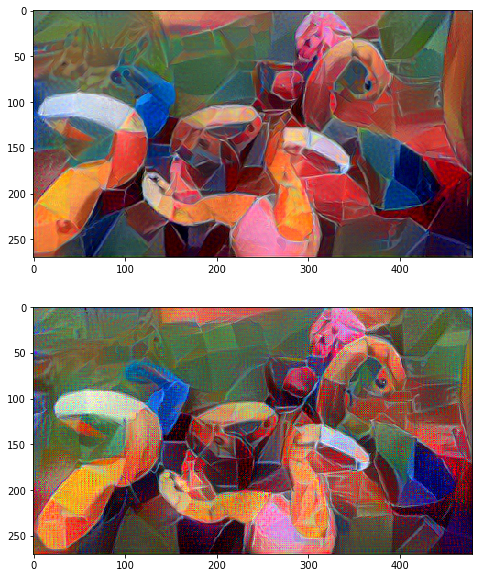

In [48]:
max_iter = 1000 # 500
show_iter = 100 # 50
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_l], max_iter=5)

n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        #out_r = vgg(opt_img_r, loss_layers)
        #layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        #new_image = F.grid_sample(opt_img_l, grid_scaled) # for cv2 - right
        
        loss = 0
        loss += sum(layer_losses_l)
        #loss += sum(layer_losses)
        #loss_disp = (((new_image[:,:,:,17:] > 0).float()*(opt_img_l[:,:,:,17:]-new_image[:,:,:,17:]))**2).sum()
        #loss_disp = (((opt_img_l[:,:,13:-13,60:-13]-new_image[:,:,13:-13,60:-13]))**2).sum() # to do: add disparity loss 
        #loss_disp = (((opt_img_r-new_image))**2).sum() # for cv2 - left
        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.005*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
           
            print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

# Simultaneousely

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 499605760.000000
Time: 0.40
Iteration: 100, loss: 212992208.000000
Time: 0.40
Iteration: 150, loss: 138371248.000000
Time: 0.40
Iteration: 200, loss: 104400336.000000
Time: 0.40
Iteration: 250, loss: 85721728.000000
Time: 0.40
Iteration: 300, loss: 73350896.000000
Time: 0.40


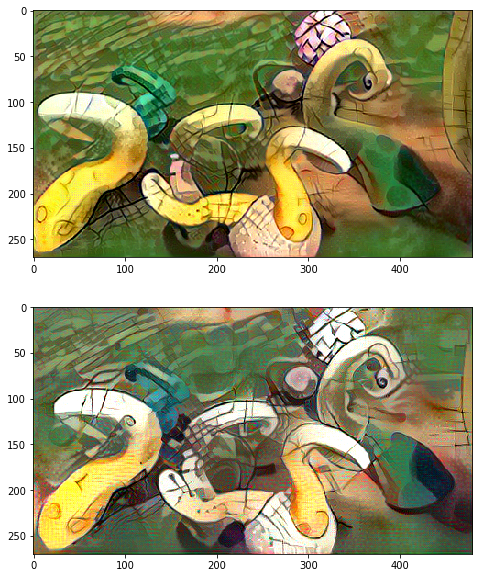

In [67]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 300 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += 20*sum(layer_losses_l) # 2 - плохо для левого 40 - для правого
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            #print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 402964480.000000
Time: 0.40
Iteration: 100, loss: 165017568.000000
Time: 0.40
Iteration: 150, loss: 105261096.000000
Time: 0.40
Iteration: 200, loss: 77769096.000000
Time: 0.40
Iteration: 250, loss: 62374464.000000
Time: 0.40
Iteration: 300, loss: 52386772.000000
Time: 0.40


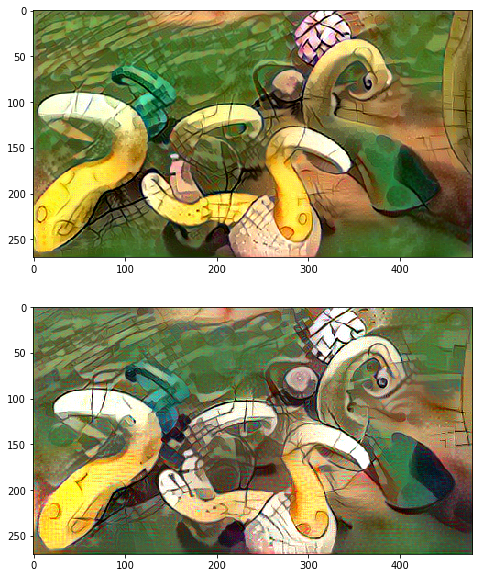

In [68]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 300 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += 10*sum(layer_losses_l) 
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            #print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 310127072.000000
Time: 0.40
Iteration: 100, loss: 114471432.000000
Time: 0.40
Iteration: 150, loss: 71875088.000000
Time: 0.40
Iteration: 200, loss: 52576532.000000
Time: 0.40
Iteration: 250, loss: 41990588.000000
Time: 0.40
Iteration: 300, loss: 34540136.000000
Time: 0.40


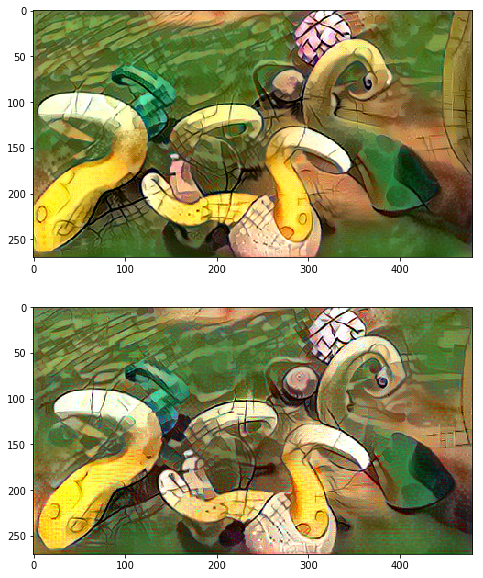

In [76]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 300 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += 3.2*sum(layer_losses_l) 
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            #print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 277114400.000000
Time: 0.40
Iteration: 100, loss: 94636920.000000
Time: 0.40
Iteration: 150, loss: 59001584.000000
Time: 0.40
Iteration: 200, loss: 42976600.000000
Time: 0.40
Iteration: 250, loss: 33972012.000000
Time: 0.40
Iteration: 300, loss: 27908088.000000
Time: 0.40


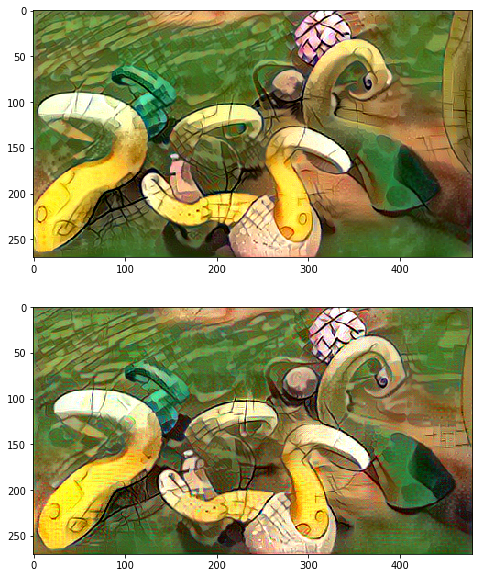

In [75]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 300 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += 1.6*sum(layer_losses_l) # best result
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            #print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 246461088.000000
Time: 0.40
Iteration: 100, loss: 84862808.000000
Time: 0.40
Iteration: 150, loss: 50679552.000000
Time: 0.40
Iteration: 200, loss: 36278604.000000
Time: 0.40
Iteration: 250, loss: 28653082.000000
Time: 0.40
Iteration: 300, loss: 23606698.000000
Time: 0.40


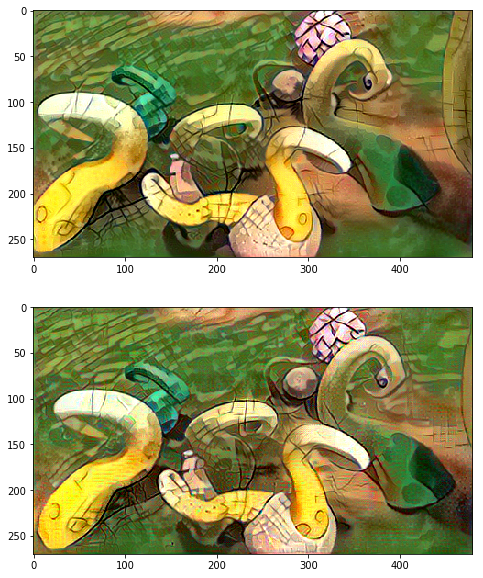

In [74]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 300 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += 0.8*sum(layer_losses_l) # 2.5 - для правого
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            #print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 218810496.000000
Time: 0.40
Iteration: 100, loss: 77744776.000000
Time: 0.40
Iteration: 150, loss: 45650836.000000
Time: 0.40
Iteration: 200, loss: 32246414.000000
Time: 0.40
Iteration: 250, loss: 25424834.000000
Time: 0.40
Iteration: 300, loss: 20717922.000000
Time: 0.40


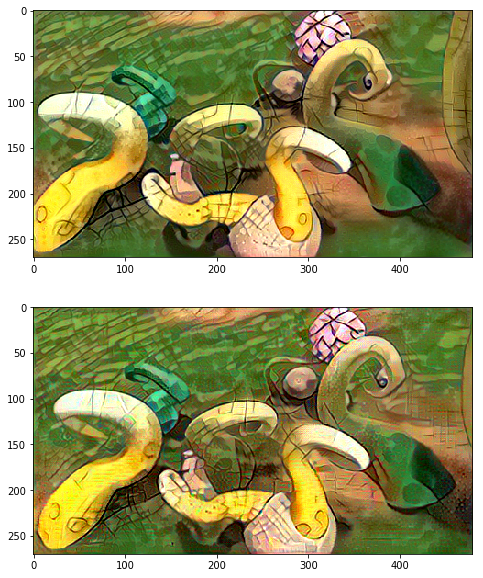

In [73]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 300 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += 0.4*sum(layer_losses_l) # 2.5 - для правого
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            #if n_iter[0]-1 > 400:
            #print('Loss on disp:', loss_disp.data.cpu().numpy())
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 140138832.000000
Time: 0.40
Iteration: 100, loss: 64036600.000000
Time: 0.40
Iteration: 150, loss: 43321200.000000
Time: 0.40
Iteration: 200, loss: 32921638.000000
Time: 0.40
Iteration: 250, loss: 26923128.000000
Time: 0.40
Iteration: 300, loss: 22693998.000000
Time: 0.40
Iteration: 350, loss: 19665418.000000
Time: 0.40
Iteration: 400, loss: 17426468.000000
Time: 0.40
Iteration: 450, loss: 15730029.000000
Time: 0.40
Iteration: 500, loss: 14355162.000000
Time: 0.40


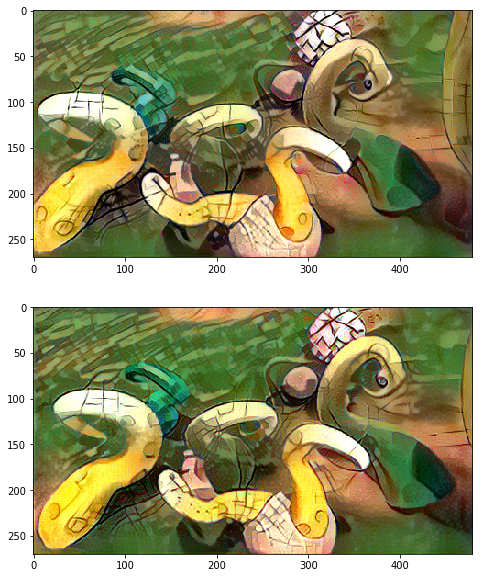

In [19]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 500 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += 0.8*sum(layer_losses_l) 
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 147652128.000000
Time: 0.40
Iteration: 100, loss: 67523792.000000
Time: 0.40
Iteration: 150, loss: 46009628.000000
Time: 0.40
Iteration: 200, loss: 35156032.000000
Time: 0.40
Iteration: 250, loss: 28625904.000000
Time: 0.40
Iteration: 300, loss: 24317718.000000
Time: 0.40
Iteration: 350, loss: 21131940.000000
Time: 0.40
Iteration: 400, loss: 18789320.000000
Time: 0.40
Iteration: 450, loss: 16906506.000000
Time: 0.40
Iteration: 500, loss: 15431686.000000
Time: 0.40


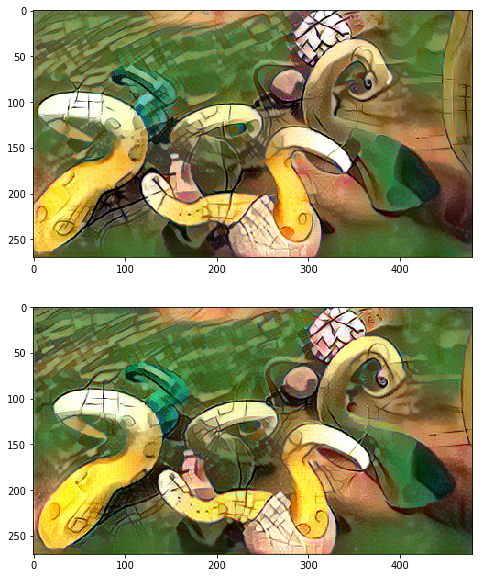

In [20]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 500 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += sum(layer_losses_l) 
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 144928736.000000
Time: 0.40
Iteration: 100, loss: 66814720.000000
Time: 0.40
Iteration: 150, loss: 45345200.000000
Time: 0.40
Iteration: 200, loss: 34968536.000000
Time: 0.40
Iteration: 250, loss: 28752928.000000
Time: 0.40
Iteration: 300, loss: 24336136.000000
Time: 0.40
Iteration: 350, loss: 21188656.000000
Time: 0.40
Iteration: 400, loss: 18797352.000000
Time: 0.40
Iteration: 450, loss: 16901592.000000
Time: 0.40
Iteration: 500, loss: 15447334.000000
Time: 0.40
Iteration: 550, loss: 14231083.000000
Time: 0.40
Iteration: 600, loss: 13211130.000000
Time: 0.40
Iteration: 650, loss: 12366378.000000
Time: 0.40
Iteration: 700, loss: 11642934.000000
Time: 0.40
Iteration: 750, loss: 11009325.000000
Time: 0.40
Iteration: 800, loss: 10455989.000000
Time: 0.40
Iteration: 850, loss: 9951558.000000
Time: 0.40
Iteration: 900, loss: 9507449.000000
Time: 0.40
Iteration: 950, loss: 9102686.000000
Time: 0.40
Iteration: 1000, loss: 8734889.000000
Time: 0.40


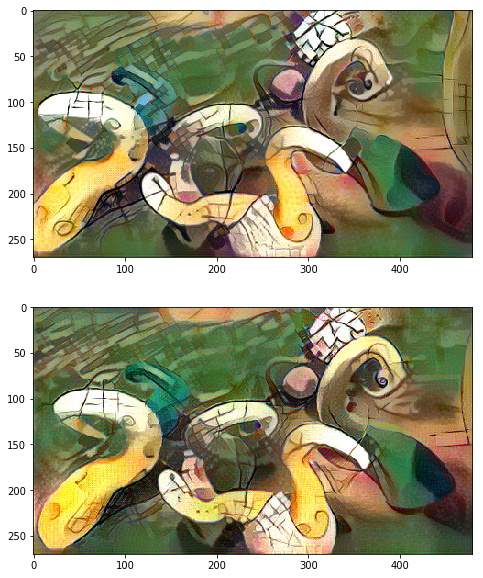

In [21]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 1000 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += sum(layer_losses_l) 
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.05*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

/home/dfokina/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Iteration: 50, loss: 339871072.000000
Time: 0.40
Iteration: 100, loss: 199676272.000000
Time: 0.40
Iteration: 150, loss: 140408896.000000
Time: 0.40
Iteration: 200, loss: 105526624.000000
Time: 0.40
Iteration: 250, loss: 85017952.000000
Time: 0.40
Iteration: 300, loss: 71221048.000000
Time: 0.40
Iteration: 350, loss: 61865200.000000
Time: 0.40
Iteration: 400, loss: 54540060.000000
Time: 0.39
Iteration: 450, loss: 48952332.000000
Time: 0.40
Iteration: 500, loss: 44412468.000000
Time: 0.40
Iteration: 550, loss: 40683904.000000
Time: 0.40
Iteration: 600, loss: 37708216.000000
Time: 0.40
Iteration: 650, loss: 35119980.000000
Time: 0.40
Iteration: 700, loss: 32870056.000000
Time: 0.40
Iteration: 750, loss: 30878240.000000
Time: 0.40
Iteration: 800, loss: 29134138.000000
Time: 0.40
Iteration: 850, loss: 27647612.000000
Time: 0.40
Iteration: 900, loss: 26283064.000000
Time: 0.40
Iteration: 950, loss: 25058288.000000
Time: 0.40
Iteration: 1000, loss: 23953928.000000
Time: 0.40


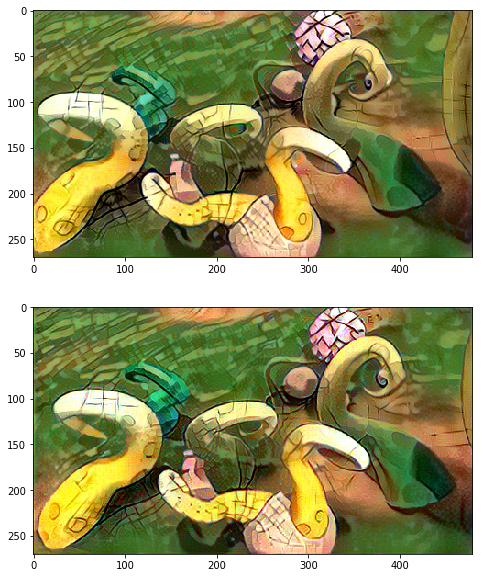

In [22]:
opt_img_l = Variable(content_image_l.data.clone(), requires_grad=True)
opt_img_r = Variable(content_image_r.data.clone(), requires_grad=True)
optimizer = optim.LBFGS([opt_img_r, opt_img_l], max_iter = 5)

max_iter = 1000 # 500
show_iter = 50 # 50
n_iter=[0]
s = opt_img_r.size()
while n_iter[0] < max_iter:

    def closure():
        begin = time.time()
        optimizer.zero_grad()
        out_r = vgg(opt_img_r, loss_layers)
        layer_losses = [weights[a] * loss_fns[a](A, targets_r[a]) for a,A in enumerate(out_r)]
        out_l = vgg(opt_img_l, loss_layers)
        layer_losses_l = [weights[a] * loss_fns[a](A, targets_l[a]) for a,A in enumerate(out_l)]
        
        loss = 0
        loss += sum(layer_losses)
        loss += sum(layer_losses_l) 
    

        loss_disp = ((model_disp(torch.cat((opt_img_l, opt_img_r),1))-disp_true)**2).sum()
        loss += 0.5*loss_disp  
        
        loss.backward()
        n_iter[0]+=1

        if (n_iter[0]-1)%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0], loss.data[0]))
            print('Time: %.2f' % ((time.time()- begin)))
        return loss
    
    optimizer.step(closure)
    
#display result
plt.subplot(211)
out_img = postp(opt_img_r.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)
plt.subplot(212)
out_img = postp(opt_img_l.data[0].cpu().squeeze())
imshow(out_img)
gcf().set_size_inches(10,10)

In [23]:
img_styled = postp(opt_img_r.data[0].cpu().squeeze())
img_styled.save('Images/abst_dispnet_134_r.png')
img_styled = postp(opt_img_l.data[0].cpu().squeeze())
img_styled.save('Images/abst_dispnet_134_l.png')